# World Food Facts

Open Food Facts is a non-profit association of volunteers. 5000+ contributors have added 600 000+ products from 150 countries using phone app. In this project, I tried to use unsupervise learning to cluster food and identify the information given from the clustering results.


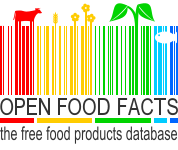

In [4]:
from IPython.display import Image, display
Image("openfoodfacts-logo-en-178x150.jpg", width=178)

#### Install Latest Plotly

In [0]:
import plotly
plotly.__version__

'3.6.1'

In [0]:
!pip uninstall -q -y plotly
!pip install plotly==3.6.0

In [0]:
import plotly
plotly.__version__

'3.6.1'

In [0]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
  '''))
  init_notebook_mode(connected=False)

## Ingest

In [0]:
import pandas as pd
import numpy as np

In [0]:
df = pd.read_csv("https://raw.githubusercontent.com/noahgift/food/master/data/features.en.openfoodfacts.org.products.csv")
df.drop(["Unnamed: 0", "exceeded", "g_sum", "energy_100g"], axis=1, inplace=True) #drop two rows we don't need
df = df.drop(df.index[[1,11877]]) #drop outlier
df.rename(index=str, columns={"reconstructed_energy": "energy_100g"}, inplace=True)
df.head()

,fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,energy_100g,product
0,28.57,64.29,14.29,3.57,0.00000,2267.85,Banana Chips Sweetened (Whole)
2,57.14,17.86,3.57,17.86,1.22428,2835.70,Organic Salted Nut Mix
3,18.75,57.81,15.62,14.06,0.13970,1953.04,Organic Muesli
4,36.67,36.67,3.33,16.67,1.60782,2336.91,Zen Party Mix
5,18.18,60.00,21.82,14.55,0.02286,1976.37,Cinnamon Nut Granola


####Clean the data

In [0]:
df["g_sum"] = df.fat_100g + df.carbohydrates_100g + df.proteins_100g + df.salt_100g
df["g_sum"] = round(df.g_sum)
df=df[df["g_sum"]<=100]
df.head()

,fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,energy_100g,product,g_sum
0,28.57,64.29,14.29,3.57,0.00000,2267.85,Banana Chips Sweetened (Whole),96.0
2,57.14,17.86,3.57,17.86,1.22428,2835.70,Organic Salted Nut Mix,94.0
3,18.75,57.81,15.62,14.06,0.13970,1953.04,Organic Muesli,91.0
4,36.67,36.67,3.33,16.67,1.60782,2336.91,Zen Party Mix,92.0
5,18.18,60.00,21.82,14.55,0.02286,1976.37,Cinnamon Nut Granola,93.0


In [0]:
df= df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 44304 entries, 0 to 45027
Data columns (total 8 columns):
fat_100g              44304 non-null float64
carbohydrates_100g    44304 non-null float64
sugars_100g           44304 non-null float64
proteins_100g         44304 non-null float64
salt_100g             44304 non-null float64
energy_100g           44304 non-null float64
product               44304 non-null object
g_sum                 44304 non-null float64
dtypes: float64(7), object(1)
memory usage: 3.0+ MB


In [0]:
df.shape

(44304, 8)

####Feature List

In [0]:
drop_list=["product"]
features=df.drop(drop_list,axis='columns')
features.head()

,fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,energy_100g,g_sum
0,28.57,64.29,14.29,3.57,0.00000,2267.85,96.0
2,57.14,17.86,3.57,17.86,1.22428,2835.70,94.0
3,18.75,57.81,15.62,14.06,0.13970,1953.04,91.0
4,36.67,36.67,3.33,16.67,1.60782,2336.91,92.0
5,18.18,60.00,21.82,14.55,0.02286,1976.37,93.0


## EDA

### Histogram

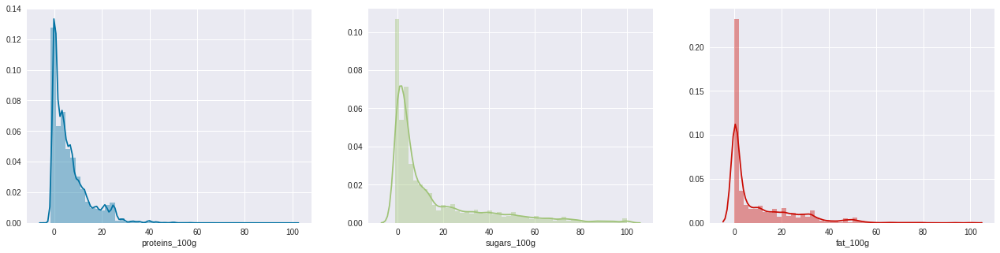

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)
#sns.set(style="white", palette="muted", color_codes=True)


# Set up the matplotlib figure
#f, axes = plt.subplots(3, 2, figsize=(20, 10), sharex=True)
fig, (axis1,axis2,axis3) = plt.subplots(1, 3,figsize=(22,5))
sns.despine(left=True)

# Plot a simple histogram with binsize determined automatically
sns.distplot(df.proteins_100g, color="b", ax=axis1)
sns.distplot(df.sugars_100g, color="g", ax=axis2)
sns.distplot(df.fat_100g, color="r", ax=axis3)

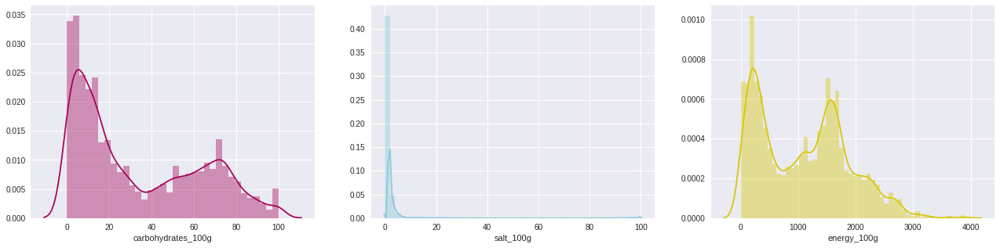

In [0]:
fig, (axis1,axis2,axis3) = plt.subplots(1, 3,figsize=(22,5))
sns.distplot(df.carbohydrates_100g, color="m", ax=axis1)
sns.distplot(df.salt_100g, color="c", ax=axis2)
sns.distplot(df.energy_100g, color="y", ax=axis3)

### Pairplot


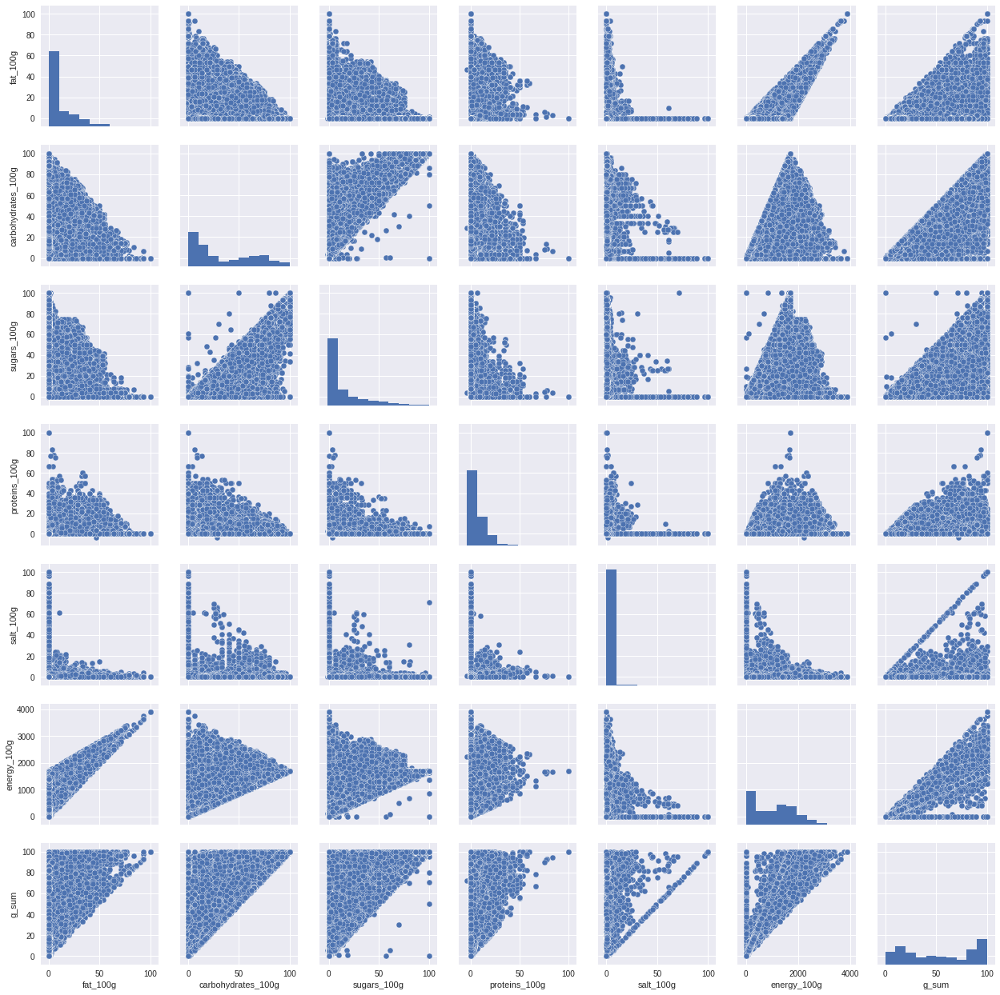

In [0]:
g = sns.pairplot(features)

###Feature Selection

In [0]:
drop_list=["product","g_sum","sugars_100g"]
features=df.drop(drop_list,axis='columns')
features.head()

,fat_100g,carbohydrates_100g,proteins_100g,salt_100g,energy_100g
0,28.57,64.29,3.57,0.00000,2267.85
2,57.14,17.86,17.86,1.22428,2835.70
3,18.75,57.81,14.06,0.13970,1953.04
4,36.67,36.67,16.67,1.60782,2336.91
5,18.18,60.00,14.55,0.02286,1976.37


## Clustering

### Scale the data

In [0]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
print(scaler.fit(features))
print(scaler.transform(features))

MinMaxScaler(copy=True, feature_range=(0, 1))
[[2.85700000e-01 6.42900000e-01 6.89388819e-02 0.00000000e+00
  5.81500000e-01]
 [5.71400000e-01 1.78600000e-01 2.06913199e-01 1.22543411e-02
  7.27102564e-01]
 [1.87500000e-01 5.78100000e-01 1.70223038e-01 1.39831693e-03
  5.00779487e-01]
 ...
 [0.00000000e+00 1.33300000e-01 3.44694410e-02 3.81359164e-04
  5.81051282e-02]
 [0.00000000e+00 1.62500000e-01 3.44694410e-02 3.81359164e-04
  7.08333333e-02]
 [0.00000000e+00 0.00000000e+00 3.44694410e-02 0.00000000e+00
  0.00000000e+00]]


### Cluster Diagnostics

#### Yellowbrick Visualizer Elbow Method

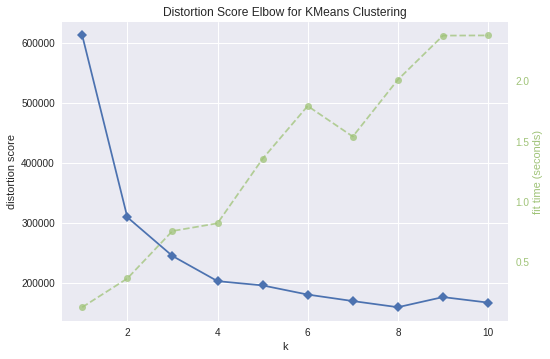

In [0]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,11))

visualizer.fit(features)    # Fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

##### Yellowbrick Silhouette Visualizer


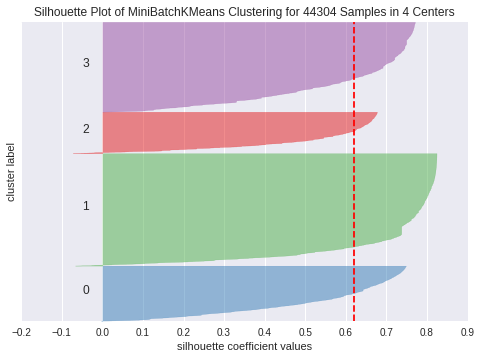

In [0]:
from sklearn.cluster import MiniBatchKMeans

from yellowbrick.cluster import SilhouetteVisualizer

# Instantiate the clustering model and visualizer
model = MiniBatchKMeans(4)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(features) # Fit the training data to the visualizer
visualizer.poof() # Draw/show/poof the data

### Add Cluster Labels

In [0]:
from sklearn.cluster import KMeans

k_means = KMeans(n_clusters=4)
kmeans = k_means.fit(scaler.transform(features))
df['cluster'] = kmeans.labels_
df.head()

,fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,energy_100g,product,g_sum,cluster
0,28.57,64.29,14.29,3.57,0.00000,2267.85,Banana Chips Sweetened (Whole),96.0,0
2,57.14,17.86,3.57,17.86,1.22428,2835.70,Organic Salted Nut Mix,94.0,2
3,18.75,57.81,15.62,14.06,0.13970,1953.04,Organic Muesli,91.0,0
4,36.67,36.67,3.33,16.67,1.60782,2336.91,Zen Party Mix,92.0,0
5,18.18,60.00,21.82,14.55,0.02286,1976.37,Cinnamon Nut Granola,93.0,0


## 3D ClusterPlot

#### Protein-Fat-Carb 3D Plot

In [0]:
import plotly.offline as py
import plotly.graph_objs as go

from plotly.offline import init_notebook_mode
enable_plotly_in_cell()


trace1 = go.Scatter3d(
    x=df["fat_100g"],
    y=df["carbohydrates_100g"],
    z=df["proteins_100g"],
    mode='markers',
    text=df["cluster"],
    marker=dict(
        size=12,
        color=df["cluster"],                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)
#print(trace1)
data = [trace1]
layout = go.Layout(
    showlegend=False,
    title="Protein-Fat-Carb:  Food Energy Types",
    scene = dict(
        xaxis = dict(title='X: Fat Content-100g'),
        yaxis = dict(title="Y: Carbs Content-100g"),
        zaxis = dict(title="Z: Protein Content-100g"),
    ),
    width=1000,
    height=900,
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

## Word Cloud

###Cluster 0

In [0]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [0]:
cluster_zero= df[df.cluster==0]
cluster_zero_text = cluster_zero['product'].values
len(cluster_zero_text)

7148

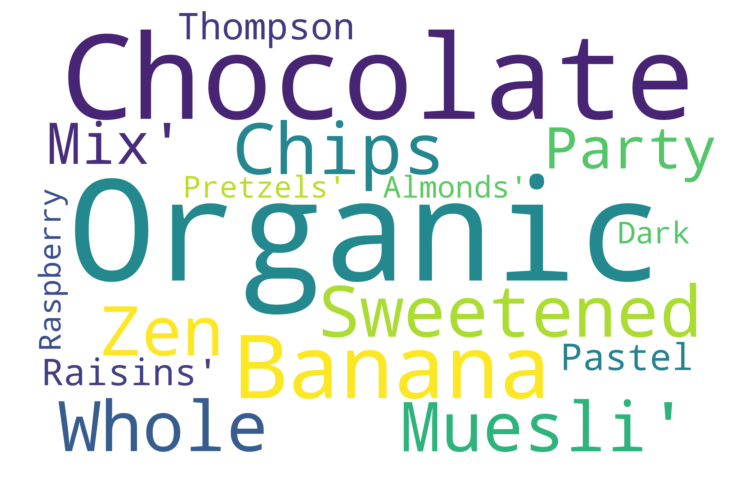

In [0]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(cluster_zero_text))

fig = plt.figure(
    figsize = (10, 7),
    facecolor = 'w',
    edgecolor = 'w')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

###Cluster 1

In [0]:
cluster_one= df[df.cluster==1]
cluster_one_text = cluster_one['product'].values
len(cluster_one_text)

21797

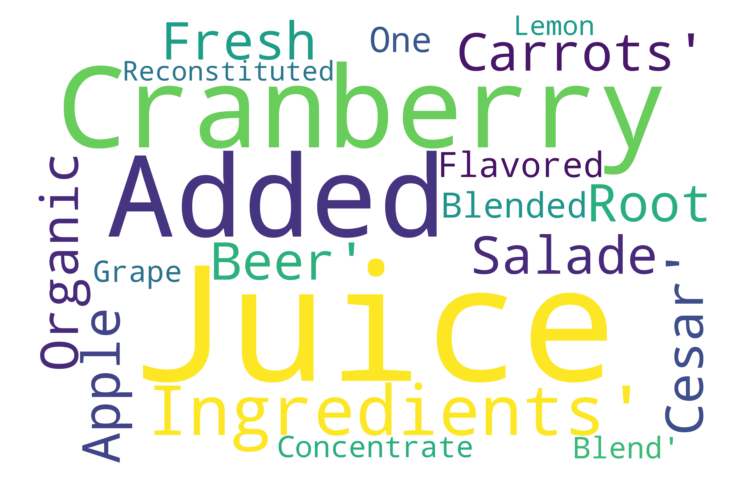

In [0]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(cluster_one_text))

fig = plt.figure(
    figsize = (10, 7),
    facecolor = 'w',
    edgecolor = 'w')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

###Cluster 2

In [0]:
cluster_two= df[df.cluster==2]
cluster_two_text = cluster_two['product'].values
len(cluster_two_text)

5121

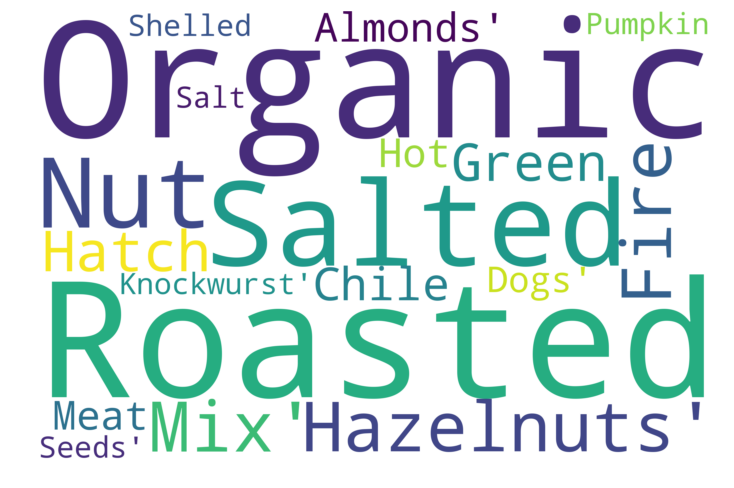

In [0]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(cluster_two_text))

fig = plt.figure(
    figsize = (10, 7),
    facecolor = 'w',
    edgecolor = 'w')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Cluster 3

In [0]:
cluster_three= df[df.cluster==3]
cluster_three_text = cluster_three['product'].values
len(cluster_three_text)

10238

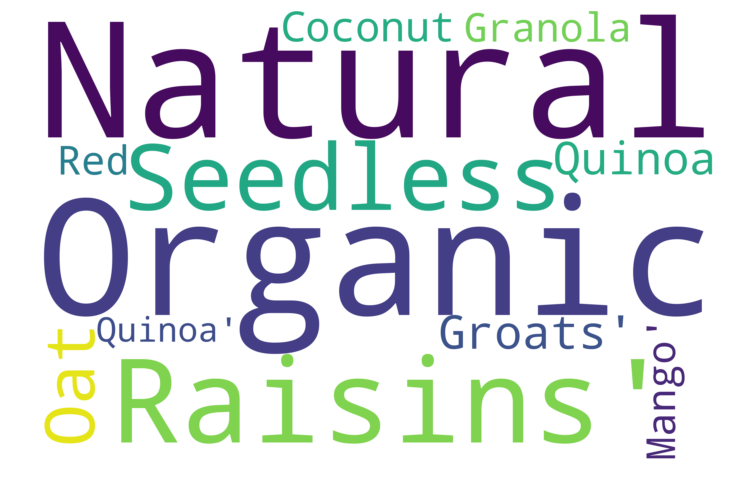

In [0]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(cluster_three_text))

fig = plt.figure(
    figsize = (10, 7),
    facecolor = 'w',
    edgecolor = 'w')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()